In [13]:
# Mengimpor libraries umum yang sering digunakan
import os, shutil
import zipfile
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm as tq
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50
import matplotlib.pyplot as plt

# Mengimpor libraries untuk visualisasi
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread

# Mengimpor libraries untuk pemrosesan data gambar
import cv2
from PIL import Image
import skimage
from skimage import io
from skimage.transform import resize
from sklearn.utils.class_weight import compute_class_weight
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

# Mengimpor libraries untuk pembuatan dan evaluasi model
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau

# Mengabaikan peringatan
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
# Import module yang disediakan google colab untuk kebutuhan upload file
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"farisghina","key":"a9bf152695d953cf4e5c887ab3662094"}'}

In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
# dataset_ids = [
# # # kentang fixx
#       "emmarex/plantdisease",
#       "rizwan123456789/potato-disease-leaf-datasetpld",
# # singkong
#     "mexwell/crop-diseases-classification",
#     "vipoooool/new-plant-diseases-dataset",
# # plant disease
#     "rashikrahmanpritom/plant-disease-recognition-dataset",
# #     "kamipakistan/plant-diseases-detection-dataset",
# # # gandum
#     "kushagra3204/wheat-plant-diseases",
# # # singkong, padi, kentang
#     "asheniranga/leaf-disease-dataset-combination",
# # # Tomato leaf
#     # "farukalam/tomato-leaf-diseases-detection-computer-vision",
#     "shylesh101/tomato-leaf-disease",
#     # "ammarnassanalhajali/tomato-diseases-dataset-csvimages",
# # # Paddy Disease
#     "imbikramsaha/paddy-doctor",
#     "loki4514/rice-leaf-diseases-detection",
#     "nizorogbezuode/rice-leaf-images"
# ]


# raw_dir = "/content/datasets_raw"
# os.makedirs(raw_dir, exist_ok=True)

# for dataset_id in dataset_ids:
#     print(f"Mengunduh {dataset_id} ...")
#     !kaggle datasets download -d {dataset_id} -p {raw_dir} --unzip

**Leaf Disease**

In [5]:
dataset_ids = [
    "asheniranga/leaf-disease-dataset-combination",
]


raw_dir = "/content/LeafDisease"
os.makedirs(raw_dir, exist_ok=True)

for dataset_id in dataset_ids:
    print(f"Mengunduh {dataset_id} ...")
    !kaggle datasets download -d {dataset_id} -p {raw_dir} --unzip

Mengunduh asheniranga/leaf-disease-dataset-combination ...
Dataset URL: https://www.kaggle.com/datasets/asheniranga/leaf-disease-dataset-combination
License(s): GPL-2.0
 96% 729M/761M [00:11<00:00, 76.5MB/s]
100% 761M/761M [00:11<00:00, 70.9MB/s]


In [6]:
import os
import shutil

# Direktori awal untuk train dan test
train_dir = "/content/LeafDisease/image data/train"
test_dir = "/content/LeafDisease/image data/test"
val_dir = "/content/LeafDisease/image data/validation"

# Direktori baru untuk dataset gabungan
combined_dir = "/content/LeafDisease/dataset"

# Buat direktori baru untuk dataset gabungan
os.makedirs(combined_dir, exist_ok=True)

# Salin file dan folder dari train
for category in os.listdir(train_dir):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

# Salin file dan folder dari test
for category in os.listdir(test_dir):
    category_dir = os.path.join(test_dir, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

for category in os.listdir(val_dir):
    category_dir = os.path.join(val_dir, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

**Dataset Kentang**

In [7]:
dataset_ids = [
# # kentang fixx
      "emmarex/plantdisease",
      "rizwan123456789/potato-disease-leaf-datasetpld"
]


raw_dir = "/content/kentang"
os.makedirs(raw_dir, exist_ok=True)

for dataset_id in dataset_ids:
    print(f"Mengunduh {dataset_id} ...")
    !kaggle datasets download -d {dataset_id} -p {raw_dir} --unzip

Mengunduh emmarex/plantdisease ...
Dataset URL: https://www.kaggle.com/datasets/emmarex/plantdisease
License(s): unknown
 99% 652M/658M [00:02<00:00, 260MB/s]
100% 658M/658M [00:02<00:00, 335MB/s]
Mengunduh rizwan123456789/potato-disease-leaf-datasetpld ...
Dataset URL: https://www.kaggle.com/datasets/rizwan123456789/potato-disease-leaf-datasetpld
License(s): DbCL-1.0
  0% 0.00/37.4M [00:00<?, ?B/s]
100% 37.4M/37.4M [00:00<00:00, 995MB/s]


In [8]:
import os
import shutil

# Direktori awal untuk train dan test
potato_train_dir = "/content/kentang/PLD_3_Classes_256/Training"
potato_test_dir = "/content/kentang/PLD_3_Classes_256/Testing"
potato_val_dir = "/content/kentang/PLD_3_Classes_256/Validation"

selected_classes = ["Potato___Early_blight", "Potato___Late_blight", "Potato___healthy"]

plantvillage = "/content/kentang/PlantVillage"

# Direktori baru untuk dataset gabungan
combined_dir = "kentang_dataset_final"

# Buat direktori baru untuk dataset gabungan
os.makedirs(combined_dir, exist_ok=True)

# Salin file dan folder dari train
for category in os.listdir(potato_train_dir):
    category_dir = os.path.join(potato_train_dir, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

# Salin file dan folder dari test
for category in os.listdir(potato_test_dir):
    category_dir = os.path.join(potato_test_dir, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

# Salin file dan folder dari validation
for category in os.listdir(potato_val_dir):
    category_dir = os.path.join(potato_val_dir, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

sources1  =  "/content/kentang/PlantVillage/Potato___Early_blight"
sources2  = "/content/kentang/PlantVillage/Potato___healthy"
sources3  = "/content/kentang/PlantVillage/Potato___Late_blight"
sources4  = "/content/LeafDisease/dataset/potato/early blight"
sources5  = "/content/LeafDisease/dataset/potato/healthy"
sources6  = "/content/LeafDisease/dataset/potato/late blight"

# Folder tujuan gabungan
target1 = "/content/kentang_dataset_final/Early_Blight"
target2 = "/content/kentang_dataset_final/Healthy"
target3 = "/content/kentang_dataset_final/Late_Blight"
os.makedirs(target1, exist_ok=True)
os.makedirs(target2, exist_ok=True)
os.makedirs(target3, exist_ok=True)

# Salin semua file dari kedua sumber ke target
def copy_contents(src, dst):
    if os.path.exists(src):
        for file in os.listdir(src):
            src_file = os.path.join(src, file)
            if os.path.isfile(src_file):
                dst_file = os.path.join(dst, file)
                shutil.copy2(src_file, dst_file)

# Lakukan penyalinan
copy_contents(sources1, target1)
copy_contents(sources2, target2)
copy_contents(sources3, target3)
copy_contents(sources4, target1)
copy_contents(sources5, target2)
copy_contents(sources6, target3)

**Dataset Padi**

In [9]:
dataset_ids = [
# # kentang fixx
    "imbikramsaha/paddy-doctor",
    "loki4514/rice-leaf-diseases-detection",
    "nizorogbezuode/rice-leaf-images"
]


raw_dir = "/content/padi"
os.makedirs(raw_dir, exist_ok=True)

for dataset_id in dataset_ids:
    print(f"Mengunduh {dataset_id} ...")
    !kaggle datasets download -d {dataset_id} -p {raw_dir} --unzip

Mengunduh imbikramsaha/paddy-doctor ...
Dataset URL: https://www.kaggle.com/datasets/imbikramsaha/paddy-doctor
License(s): CC0-1.0
 98% 1.00G/1.02G [00:03<00:00, 264MB/s]
100% 1.02G/1.02G [00:03<00:00, 308MB/s]
Mengunduh loki4514/rice-leaf-diseases-detection ...
Dataset URL: https://www.kaggle.com/datasets/loki4514/rice-leaf-diseases-detection
License(s): apache-2.0
^C
Mengunduh nizorogbezuode/rice-leaf-images ...
Dataset URL: https://www.kaggle.com/datasets/nizorogbezuode/rice-leaf-images
License(s): copyright-authors
  0% 0.00/17.7M [00:00<?, ?B/s]
100% 17.7M/17.7M [00:00<00:00, 883MB/s]


In [10]:
import os
import shutil

# Direktori awal untuk train dan test
paddy_train_dir = "/content/padi/paddy-disease-classification/train_images"
# rice_dir = "/content/padi/rice_images"
# leaf_padi = "/content/LeafDisease/dataset/Rice"

# Direktori baru untuk dataset gabungan
combined_dir = "padi_dataset"

# Buat direktori baru untuk dataset gabungan
os.makedirs(combined_dir, exist_ok=True)

# Salin file dan folder dari train
for category in os.listdir(paddy_train_dir):
    category_dir = os.path.join(paddy_train_dir, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

# Salin file dan folder dari test
# for category in os.listdir(rice_dir):
#     category_dir = os.path.join(rice_dir, category)
#     if os.path.isdir(category_dir):
#         shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

# for category in os.listdir(leaf_padi):
#     category_dir = os.path.join(leaf_padi, category)
#     if os.path.isdir(category_dir):
#         shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

sources1  =  "/content/padi/rice_images/_BrownSpot"
sources2  = "/content/padi/rice_images/_Healthy"
sources3  = "/content/padi/rice_images/_Hispa"
sources4  = "/content/padi/rice_images/_LeafBlast"
sources5  = "/content/LeafDisease/dataset/Rice/BrownSpot"
sources6  = "/content/LeafDisease/dataset/Rice/Healthy"
sources7  = "/content/LeafDisease/dataset/Rice/Hispa"
sources8  = "/content/LeafDisease/dataset/Rice/LeafBlast"

# Folder tujuan gabungan
target1 = "/content/padi_dataset/brown_spot"
target2 = "/content/padi_dataset/normal"
target3 = "/content/padi_dataset/hispa"
target4 = "/content/padi_dataset/blast"
# os.makedirs(target1, exist_ok=True)
# os.makedirs(target2, exist_ok=True)
# os.makedirs(target3, exist_ok=True)
# os.makedirs(target4, exist_ok=True)

# # Salin semua file dari kedua sumber ke target
def copy_contents(src, dst):
    if os.path.exists(src):
        for file in os.listdir(src):
            src_file = os.path.join(src, file)
            if os.path.isfile(src_file):
                dst_file = os.path.join(dst, file)
                shutil.copy2(src_file, dst_file)

# Lakukan penyalinan
copy_contents(sources1, target1)
copy_contents(sources2, target2)
copy_contents(sources3, target3)
copy_contents(sources4, target4)
copy_contents(sources5, target1)
copy_contents(sources6, target2)
copy_contents(sources7, target3)
copy_contents(sources8, target4)

**Dataset Singkong**

In [11]:
dataset_ids = [
  "mexwell/crop-diseases-classification",
  "vipoooool/new-plant-diseases-dataset",
]


raw_dir = "/content/singkong"
os.makedirs(raw_dir, exist_ok=True)

for dataset_id in dataset_ids:
    print(f"Mengunduh {dataset_id} ...")
    !kaggle datasets download -d {dataset_id} -p {raw_dir} --unzip

Mengunduh mexwell/crop-diseases-classification ...
Dataset URL: https://www.kaggle.com/datasets/mexwell/crop-diseases-classification
License(s): other
 98% 1.96G/2.00G [00:14<00:00, 252MB/s]
100% 2.00G/2.00G [00:14<00:00, 144MB/s]
Mengunduh vipoooool/new-plant-diseases-dataset ...
Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
 98% 2.63G/2.70G [01:33<00:03, 18.0MB/s]
100% 2.70G/2.70G [01:33<00:00, 31.1MB/s]


In [12]:
import os, json, shutil

# Path dataset
csv_path = "/content/singkong/Data/train.csv"
json_path = "/content/singkong/Data/label_num_to_disease_map.json"
image_path = "/content/singkong/Data/train_images"
output_dir = '/content/singkong_dataset_final'

os.makedirs(output_dir, exist_ok=True)


# Load data
df = pd.read_csv(csv_path)

# Load mapping dari label angka ke nama penyakit
with open(json_path, "r") as file:
    label_map = json.load(file)

# Filter hanya file yang ada di direktori
df = df[df["image_id"].isin(os.listdir(image_path))]
df.reset_index(drop=True, inplace=True)

# Tambah kolom nama label
df["label_name"] = df["label"].apply(lambda x: label_map[str(x)])

# Buat folder untuk setiap label
for label in df["label_name"].unique():
    os.makedirs(os.path.join(output_dir, label), exist_ok=True)

# Salin file gambar ke folder sesuai label
not_found = []
for _, row in df.iterrows():
    fname = row["image_id"]
    label = row["label_name"]
    src = os.path.join(image_path, fname)
    dst = os.path.join(output_dir, label, fname)

    if os.path.exists(src):
        shutil.copy2(src, dst)
    else:
        not_found.append(fname)

print(f"✅ Berhasil mengklasifikasi {len(df)-len(not_found)} gambar.")
if not_found:
    print(f"❌ {len(not_found)} gambar tidak ditemukan. Contoh: {not_found[:5]}")


✅ Berhasil mengklasifikasi 17938 gambar.


**Dataset Gandum**

In [13]:
dataset_ids = [
    "kushagra3204/wheat-plant-diseases",
    "olyadgetch/wheat-leaf-dataset"
]


raw_dir = "/content/gandum"
os.makedirs(raw_dir, exist_ok=True)

for dataset_id in dataset_ids:
    print(f"Mengunduh {dataset_id} ...")
    !kaggle datasets download -d {dataset_id} -p {raw_dir} --unzip

Mengunduh kushagra3204/wheat-plant-diseases ...
Dataset URL: https://www.kaggle.com/datasets/kushagra3204/wheat-plant-diseases
License(s): CC0-1.0
^C
Mengunduh olyadgetch/wheat-leaf-dataset ...
Dataset URL: https://www.kaggle.com/datasets/olyadgetch/wheat-leaf-dataset
License(s): copyright-authors
 99% 1.40G/1.41G [01:04<00:00, 54.3MB/s]
100% 1.41G/1.41G [01:04<00:00, 23.4MB/s]


In [14]:
import os
import shutil

# Direktori awal untuk train dan test
wheat_leaf = "/content/gandum/wheat_leaf"

# Direktori baru untuk dataset gabungan
combined_dir = "/content/gandum_dataset_final"

# Buat direktori baru untuk dataset gabungan
os.makedirs(combined_dir, exist_ok=True)

# Salin file dan folder dari train
for category in os.listdir(wheat_leaf):
    category_dir = os.path.join(wheat_leaf, category)
    if os.path.isdir(category_dir):
        shutil.copytree(category_dir, os.path.join(combined_dir, category), dirs_exist_ok=True)

In [15]:
# Mapping folder sumber
sources = {
    "gandum": "/content/gandum_dataset_final",
    "kentang": "/content/kentang_dataset_final",
    "padi": "/content/padi_dataset",
    "singkong": "/content/singkong_dataset_final"
}

target_dir = "/content/dataset_final_merged"
os.makedirs(target_dir, exist_ok=True)

for tanaman, source_dir in sources.items():
    for label in os.listdir(source_dir):
        label_path = os.path.join(source_dir, label)
        if os.path.isdir(label_path):
            # Buat folder target gabungan
            combined_label = f"{tanaman}_{label.replace(' ', '_')}"
            target_label_path = os.path.join(target_dir, combined_label)
            os.makedirs(target_label_path, exist_ok=True)

            # Salin semua gambar ke folder gabungan
            for file in os.listdir(label_path):
                src_file = os.path.join(label_path, file)
                dst_file = os.path.join(target_label_path, file)
                shutil.copy2(src_file, dst_file)

print("✅ Dataset berhasil digabung.")


✅ Dataset berhasil digabung.


In [16]:
import os

merged_dir = "/content/dataset_final_merged"
class_names = sorted([d for d in os.listdir(merged_dir) if os.path.isdir(os.path.join(merged_dir, d))])

print("📦 Total kelas:", len(class_names))
print("📚 Daftar kelas:")
for cls in class_names:
    print("-", cls)


📦 Total kelas: 21
📚 Daftar kelas:
- gandum_Healthy
- gandum_septoria
- gandum_stripe_rust
- kentang_Early_Blight
- kentang_Healthy
- kentang_Late_Blight
- padi_bacterial_leaf_blight
- padi_bacterial_leaf_streak
- padi_bacterial_panicle_blight
- padi_blast
- padi_brown_spot
- padi_dead_heart
- padi_downy_mildew
- padi_hispa
- padi_normal
- padi_tungro
- singkong_Cassava_Bacterial_Blight_(CBB)
- singkong_Cassava_Brown_Streak_Disease_(CBSD)
- singkong_Cassava_Green_Mottle_(CGM)
- singkong_Cassava_Mosaic_Disease_(CMD)
- singkong_Healthy


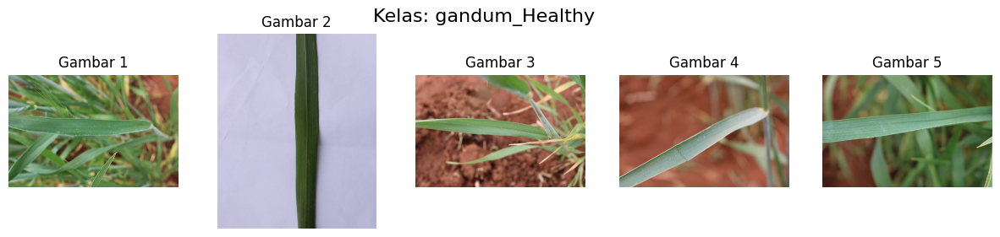

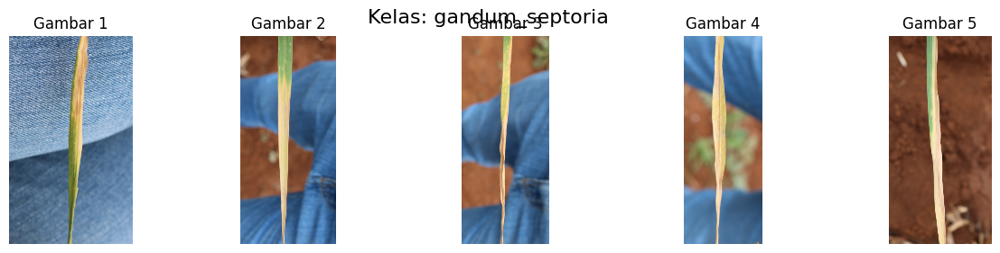

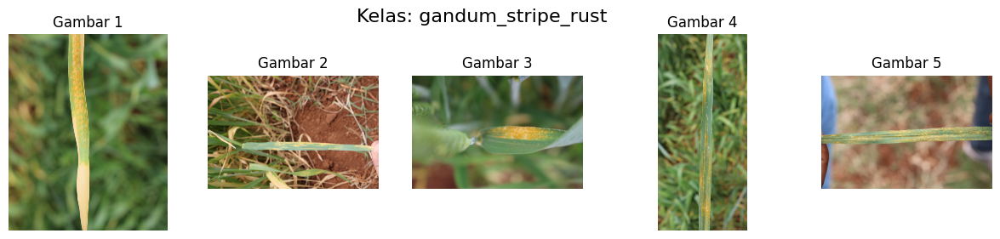

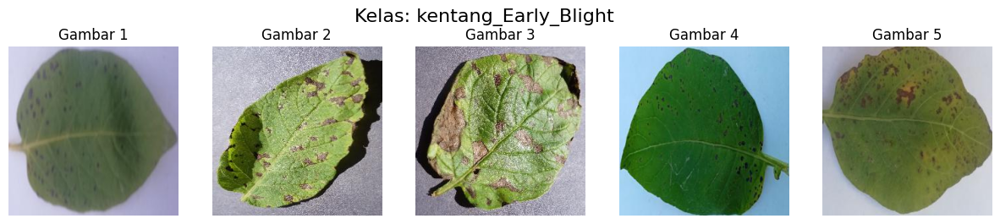

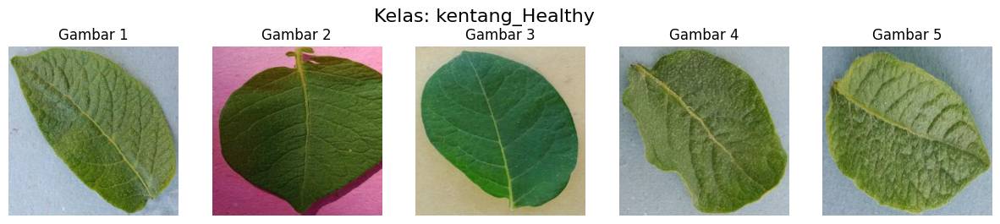

...

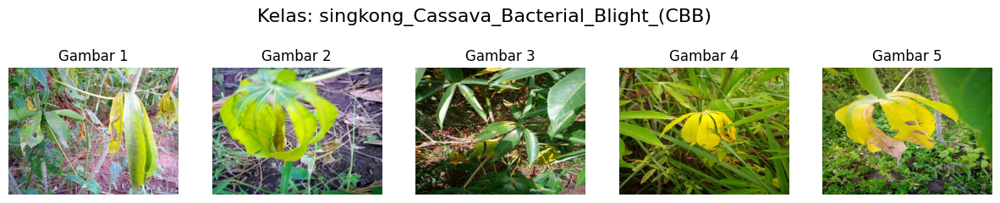

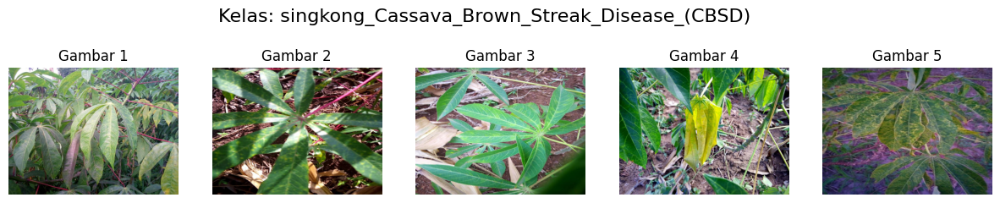

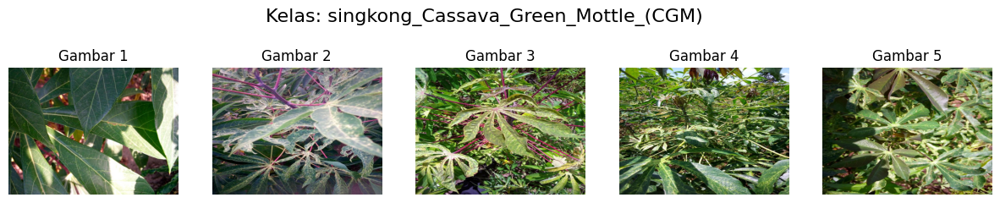

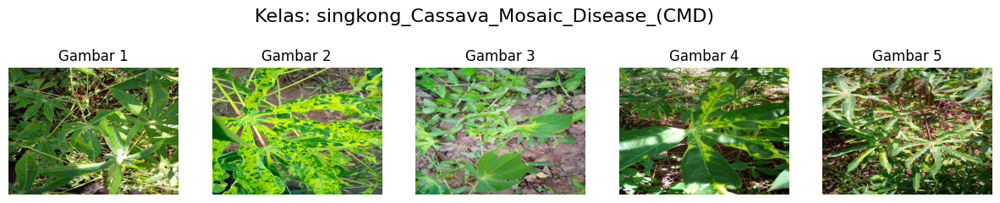

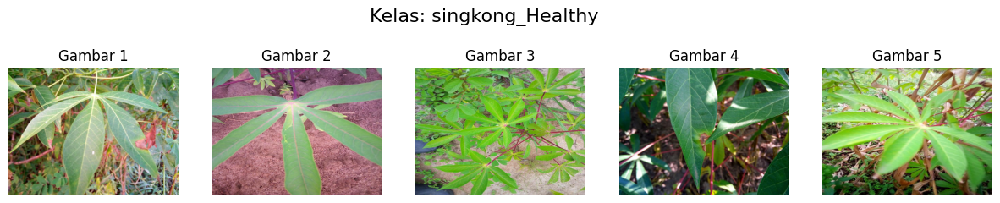

In [17]:

dataset_dir = '/content/dataset_final_merged'
num_images_per_class = 5

# Ambil daftar kelas
classes = sorted(os.listdir(dataset_dir))

for class_name in classes:
    class_path = os.path.join(dataset_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    images = os.listdir(class_path)[:num_images_per_class]

    plt.figure(figsize=(15, 3))
    plt.suptitle(f"Kelas: {class_name}", fontsize=16)

    for i, img_name in enumerate(images):
        img_path = os.path.join(class_path, img_name)
        img = Image.open(img_path)

        plt.subplot(1, num_images_per_class, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Gambar {i+1}")

    plt.show()


In [18]:
file_name = []
labels = []
full_path = []
for path, subdirs, files in os.walk(dataset_dir):
    for name in files:
        full_path.append(os.path.join(path, name))
        labels.append(path.split('/')[-1])
        file_name.append(name)

# Memasukkan variabel yang sudah dikumpulkan pada looping di atas menjadi sebuah dataframe agar rapi
df = pd.DataFrame({"path":full_path,'file_name':file_name,"labels":labels})
# Melihat jumlah data gambar pada masing-masing label
df.groupby(['labels']).size()

,0
labels,
gandum_Healthy,102
gandum_septoria,97
gandum_stripe_rust,208
kentang_Early_Blight,2303
kentang_Healthy,968
kentang_Late_Blight,2142
padi_bacterial_leaf_blight,479
padi_bacterial_leaf_streak,380
padi_bacterial_panicle_blight,337


In [19]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (224, 224)
BATCH_SIZE = 1024

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/dataset_final_merged',
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/dataset_final_merged',
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Total kelas: {num_classes}")


Found 37520 files belonging to 21 classes.
Using 30016 files for training.
Found 37520 files belonging to 21 classes.
Using 7504 files for validation.
Total kelas: 21


In [21]:
base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)
base_model.trainable = False  # Freeze base model

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(21, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Ekstrak label dari train_ds
y_train = np.concatenate([y.numpy() for x, y in train_ds])

# Hitung bobot kelas otomatis
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weight_dict = dict(enumerate(class_weights))

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=50,
    class_weight=class_weight_dict
)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 285s 7s/step - accuracy: 0.2583 - loss: 2.3952 - val_accuracy: 0.5388 - val_loss: 1.2628
Epoch 2/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 150s 5s/step - accuracy: 0.5031 - loss: 1.2732 - val_accuracy: 0.6155 - val_loss: 1.0732
Epoch 3/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 151s 5s/step - accuracy: 0.5688 - loss: 1.0710 - val_accuracy: 0.6365 - val_loss: 1.0185
Epoch 4/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 203s 5s/step - accuracy: 0.5992 - loss: 0.9529 - val_accuracy: 0.6273 - val_loss: 1.0239
Epoch 5/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 164s 5s/step - accuracy: 0.6237 - loss: 0.8785 - val_accuracy: 0.6704 - val_loss: 0.9220
Epoch 6/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 174s 6s/step - accuracy: 0.6463 - loss: 0.8215 - val_accuracy: 0.6763 - val_loss: 0.8955
Epoch 7/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 205s 6s/step - accuracy: 0.6699 - loss: 0.7691 - val_accuracy: 0.6854 - val_loss: 0.8833
Epoch 8/50
30/30 ━━━━━━━━━━━━━━━━━━━━ 189s 5s/step - accurac

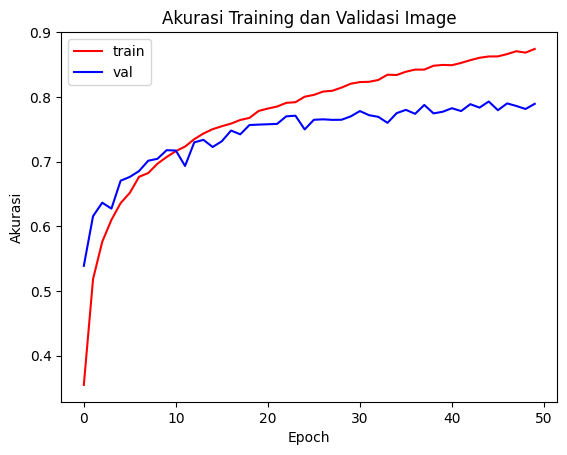

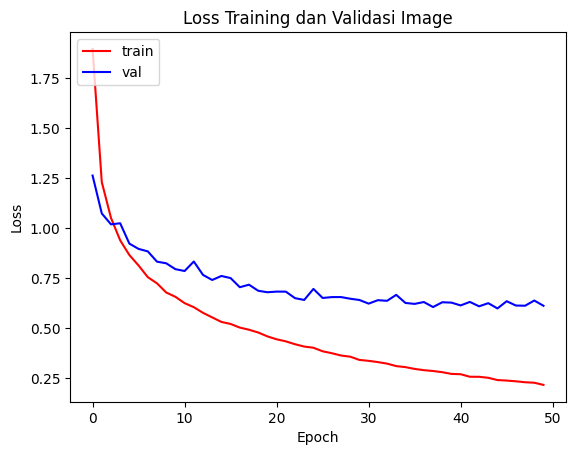

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r')
plt.plot(epochs, val_acc, 'b')
plt.title('Akurasi Training dan Validasi Image')
plt.ylabel('Akurasi')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(epochs, loss, 'r')
plt.plot(epochs, val_loss, 'b')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.title('Loss Training dan Validasi Image')
plt.show()

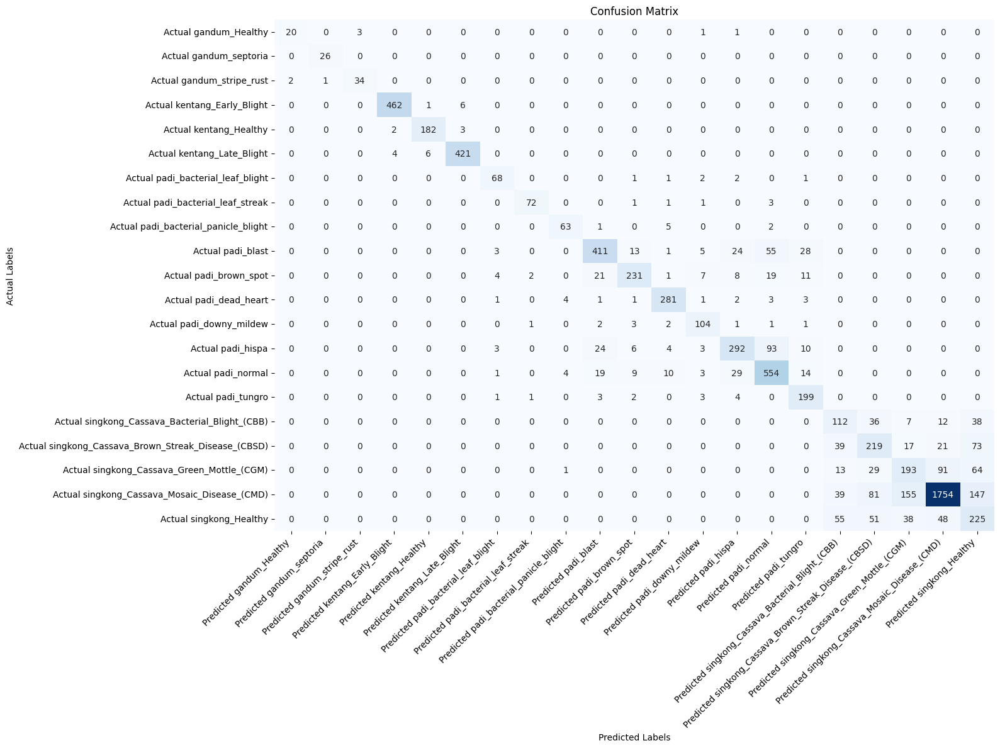


Classification Report:
                                              precision    recall  f1-score   support

                              gandum_Healthy     0.9091    0.8000    0.8511        25
                             gandum_septoria     0.9630    1.0000    0.9811        26
                          gandum_stripe_rust     0.9189    0.9189    0.9189        37
                        kentang_Early_Blight     0.9872    0.9851    0.9861       469
                             kentang_Healthy     0.9630    0.9733    0.9681       187
                         kentang_Late_Blight     0.9791    0.9768    0.9779       431
                  padi_bacterial_leaf_blight     0.8395    0.9067    0.8718        75
                  padi_bacterial_leaf_streak     0.9474    0.9231    0.9351        78
               padi_bacterial_panicle_blight     0.8750    0.8873    0.8811        71
                                  padi_blast     0.8527    0.7611    0.8043       540
                             

In [23]:
# Ambil nama kelas dari dataset
class_names = val_ds.class_names

# Inisialisasi list untuk y_true dan y_pred
y_true = []
y_pred = []

# Loop data validation
for images, labels in val_ds:
    preds = model.predict(images, verbose=0)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(labels.numpy())

# Konversi ke array NumPy
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Buat confusion matrix dalam bentuk DataFrame
cm = pd.DataFrame(
    confusion_matrix(y_true, y_pred),
    index=[f"Actual {cls}" for cls in class_names],
    columns=[f"Predicted {cls}" for cls in class_names]
)

# Plot heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.ylabel("Actual Labels")
plt.xlabel("Predicted Labels")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Print classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

In [1]:
!pip install tensorflowjs

In [16]:
# model.save("tflite_model/model.h5")  # Simpan model .h5

# Load ulang model dari .h5 (penting agar bisa dikonversi)
loaded_model = tf.keras.models.load_model("tflite_model/model.h5")

# Konversi ke TFLite
converter = tf.lite.TFLiteConverter.from_keras_model(loaded_model)
tflite_model = converter.convert()

# Simpan model TFLite
with open("tflite_model/converted_model.tflite", "wb") as f:
    f.write(tflite_model)

# Simpan label
# class_names = train_ds.class_names
# with open("tflite_model/label.txt", "w") as f:
#     for class_name in class_names:
#         f.write(class_name + "\n")

# === Konversi ke TensorFlow.js ===
!tensorflowjs_converter --input_format=keras tflite_model/model.h5 tfjs_model

# !tensorflowjs_converter --input_format=keras model.h5 tfjs_model

# Simpan ke format SavedModel
# model.export("saved_model_format")
# !tensorflowjs_converter --input_format=tf_saved_model saved_model_format tfjs_model

Saved artifact at '/tmp/tmps02hjnuh'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 21), dtype=tf.float32, name=None)
Captures:
  136265246653136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246651600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246651408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246652176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246652944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246651792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246649872: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246649296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246649104: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246650256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136265246652

In [11]:
!tensorflowjs_converter --input_format=keras tflite_model/model.h5 tfjs_model

# model.export("saved_model_format")
# !tensorflowjs_converter --input_format=tf_saved_model saved_model_format tfjs_model

2025-06-13 05:51:03.958116: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749793863.978569   56986 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749793863.984697   56986 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-06-13 05:51:04.004839: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
failed

In [3]:
from google.colab import files
files.download('tflite_model/model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [17]:
!zip -r all_models.zip model.h5 tflite_model tfjs_model

	zip warning: name not matched: model.h5
updating: tflite_model/ (stored 0%)
updating: tflite_model/model.h5 (deflated 8%)
updating: tfjs_model/ (stored 0%)
  adding: tflite_model/converted_model.tflite (deflated 7%)
  adding: tfjs_model/group1-shard8of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard17of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard9of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard12of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard1of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard21of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard13of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard10of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard15of23.bin (deflated 8%)
  adding: tfjs_model/group1-shard19of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard5of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard16of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard18of23.bin (deflated 7%)
  adding: tfjs_model/group1-shard

In [18]:
files.download('all_models.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!zip -r dataset_final_merged.zip dataset_final_merged
files.download('dataset_final_merged.zip')